# Face mask detection dataset EDA


First of all, lets import all the libraries we needed

In [1]:
import cv2
import os
from glob import glob
import xml.etree.ElementTree as ET
import pandas as pd

In [2]:
# this is for colab only, we need to download the dataset and move it in the path
# !curl -L -o ./face-mask-detection.zip https://www.kaggle.com/api/v1/datasets/download/andrewmvd/face-mask-detection
# !unzip ./face-mask-detection.zip -d ./facemask_dataset

I initially used kaggle notebook and then moved to local for initial processing. Adjust the paths accordingly.

In [3]:
# IMAGES_PATH = "/kaggle/input/face-mask-detection/images"
# ANNOTATIONS_PATH = "/kaggle/input/face-mask-detection/annotations"
DATASET_DIRECTORY = "/kaggle/input/face-mask-detection"
IMAGES_PATH = os.path.join(DATASET_DIRECTORY, "images")
ANNOTATIONS_PATH = os.path.join(DATASET_DIRECTORY, "annotations")
RANDOM_SEED = 11563

Standard practice, examine the format of the annotation and make notes of the available classes to map to another format when needed.

The goal of this process is to:
1. Understand the format just in case we need to parse it to another format later.
2. See if the annotations provided certain values or flags we can use to segment the dataset to inspect specific scenarios when needed.
3. Take a look at the distribution of certain classes / objects, the class names, and other important thing that might need attention.

In [4]:
all_annots = glob(os.path.join(ANNOTATIONS_PATH, "*.xml"))
print(all_annots[:5])

['/kaggle/input/face-mask-detection/annotations/maksssksksss737.xml', '/kaggle/input/face-mask-detection/annotations/maksssksksss410.xml', '/kaggle/input/face-mask-detection/annotations/maksssksksss537.xml', '/kaggle/input/face-mask-detection/annotations/maksssksksss295.xml', '/kaggle/input/face-mask-detection/annotations/maksssksksss771.xml']


### Note

We have 3 classes name:
- with_mask
- mask_weared_incorrect
- without_mask

Bounding box is in <bndbox> tags and are already named properly so we dont need to worry about the order. Need to normalize later if needed.

Original image width and height already included.

Also need to see if the pascal VOC flags (truncated, occluded, difficult) are filled, might be great for segmenting the dataset later.

Let's first see what the annotation is like.

In [5]:
with open(all_annots[0]) as f:
    print(f.read())


<annotation>
    <folder>images</folder>
    <filename>maksssksksss737.png</filename>
    <size>
        <width>400</width>
        <height>226</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>28</xmin>
            <ymin>55</ymin>
            <xmax>46</xmax>
            <ymax>71</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>98</xmin>
            <ymin>62</ymin>
            <xmax>111</xmax>
            <ymax>78</ymax>
        </bndbox>
    </object>
    <object>
        <name>mask_weared_incorrect</name>
        <pose>Unspecified</pose>
        <truncated>0

Now we know what the structure is, we can write a simple parser to parse the annotation into easier to process python data structure.

In [6]:
def parse_one_image_annotation(annot_path: str) -> list[dict]:
    results = []
    xml_tree = ET.parse(annot_path)
    root = xml_tree.getroot()
    file_name = root.find("filename").text
    image_size = root.find("size")
    image_width = int(image_size.find("width").text)
    image_height = int(image_size.find("height").text)
    for detection in root.findall("object"):
        classname = detection.find("name").text
        pose = detection.find("pose").text
        truncated = detection.find("truncated").text
        occluded = detection.find("occluded").text
        difficult = detection.find("difficult").text
        bbox = detection.find("bndbox")
        xmin = int(bbox.find("xmin").text)
        ymin = int(bbox.find("ymin").text)
        xmax = int(bbox.find("xmax").text)
        ymax = int(bbox.find("ymax").text)
        results.append([file_name, image_width, image_height, classname, xmin, ymin, xmax, ymax, truncated, occluded, difficult])
    return results

On preliminary manual inspection (outside of this notebook) i noticed an image being duplicated, so first let's de-duplicate our data. No need to run the cell below if you're using vscode btw, i already included all required libraries in the uv setup file.

In [7]:
!pip install imagededup

In [8]:
from imagededup.methods import PHash
from imagededup.utils import plot_duplicates

phash = PHash()

encodings = phash.encode_images(image_dir=IMAGES_PATH)

duplicates = phash.find_duplicates(
    image_dir=IMAGES_PATH,
    encoding_map=encodings
)

2026-02-09 05:01:52,038: INFO Start: Calculating hashes...
100%|██████████| 853/853 [00:05<00:00, 154.88it/s]
2026-02-09 05:01:57,662: INFO End: Calculating hashes!
2026-02-09 05:01:57,671: INFO Start: Calculating hashes...
100%|██████████| 853/853 [00:04<00:00, 173.11it/s]
2026-02-09 05:02:02,704: INFO End: Calculating hashes!
2026-02-09 05:02:02,705: INFO Start: Evaluating hamming distances for getting duplicates
2026-02-09 05:02:02,706: INFO Start: Retrieving duplicates using Cython Brute force algorithm
100%|██████████| 853/853 [00:00<00:00, 4381.98it/s]
2026-02-09 05:02:02,972: INFO End: Retrieving duplicates using Cython Brute force algorithm
2026-02-09 05:02:02,973: INFO End: Evaluating hamming distances for getting duplicates


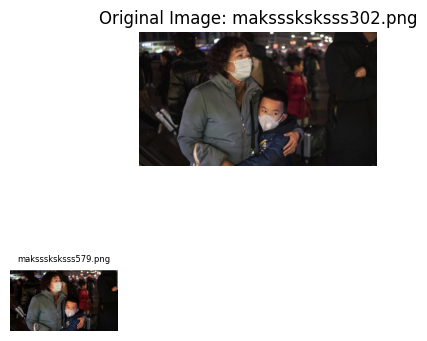

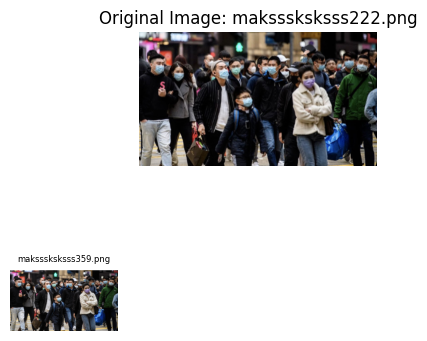

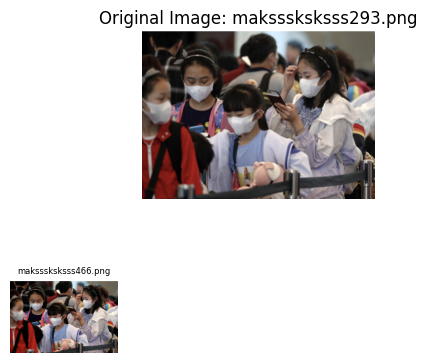

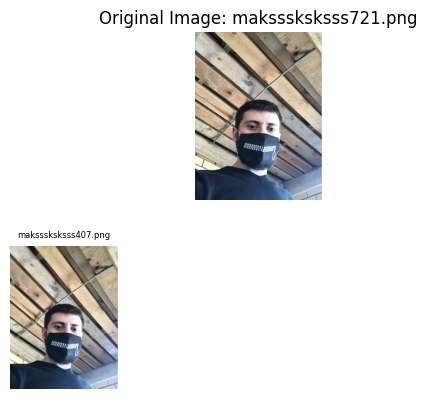

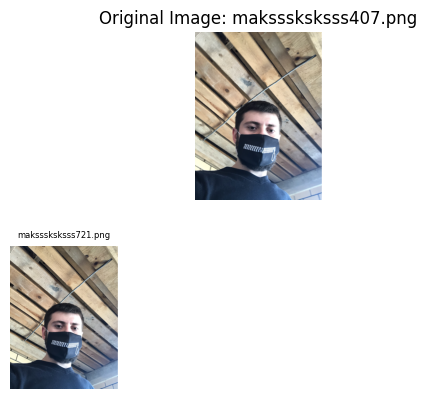

In [9]:
i = 0
MAX_PLOTS = 5
all_duplicate_images = []
for image_path, duplicate_matches in duplicates.items():
    if duplicate_matches:
        plot_duplicates(image_dir=IMAGES_PATH,
                duplicate_map=duplicates,
                filename=image_path)
        i += 1
        if i == MAX_PLOTS:
            break

Yep, definitely some more duplicates. Keep in mind perception hash does not just get exact duplicates, we have some false positives (notice last image), so we need to exclude them because they are quite different images.

In [10]:
duplicate_false_positives = [
    87, 485,
    291, 405,
    369, 491,
    468, 608,
    17, 332
]

duplicate_false_positives = [f"maksssksksss{num}.png" for num in duplicate_false_positives]


The duplicates are two-ways so we need to process it further to make it one-way so we can mark all duplicates for deletion.

In [11]:
duplicates_set = set()
for image_path, duplicate_matches in duplicates.items():
    if not duplicate_matches:
        continue
    duplicate_string = "|".join(sorted([image_path] + duplicate_matches))
    duplicates_set.add(duplicate_string)

duplicates_list = set()

for ds in duplicates_set:
    dupes = ds.split("|")[1:]
    duplicates_list.update(dupes)
# now we remove all images that aren't actually duplicates
cleaned_duplicates_list = duplicates_list - set(duplicate_false_positives)

print(len(duplicates_list))
print(len(cleaned_duplicates_list))

28
23


In [12]:
clean_image_list = list(set(os.listdir(IMAGES_PATH)) - cleaned_duplicates_list)
print(len(clean_image_list))

830


In [13]:
clean_annotations_list = [os.path.join(ANNOTATIONS_PATH, imfile[:-3] + "xml") for imfile in clean_image_list]

Parsing all the detections and moving them to a pandas dataframe for easier inspecting. I dont want to touch XMLs more than i need to.

In [14]:
headers = ["image_name", "image_width", "image_height", "classname", "xmin", "ymin", "xmax", "ymax", "truncated", "occluded", "difficult"]
all_rows = []
for annot_file in clean_annotations_list:
    annotations = parse_one_image_annotation(annot_file)
    all_rows.extend(annotations)

df = pd.DataFrame(all_rows, columns=headers)

In [15]:
df.head()

,image_name,image_width,image_height,classname,xmin,ymin,xmax,ymax,truncated,occluded,difficult
0,maksssksksss518.png,400,225,with_mask,3,112,12,122,0,0,0
1,maksssksksss518.png,400,225,with_mask,27,178,35,186,0,0,0
2,maksssksksss518.png,400,225,with_mask,25,107,35,117,0,0,0
3,maksssksksss518.png,400,225,with_mask,51,108,61,120,0,0,0
4,maksssksksss518.png,400,225,without_mask,43,137,53,148,0,0,0


In [16]:
for key in ["truncated", "occluded", "difficult"]:
    print(key, df[key].unique())

truncated ['0']
occluded ['0']
difficult ['0']


So basically they dont fill the pascal VOC flags values at all. We only have class and bbox information, so we need to rely fully on manual exploration to identify good attributes to segment the data into scenarios we want to test.

Next we're going to see the class distribution.

In [17]:
df["classname"].value_counts()

classname
with_mask                3059
without_mask              691
mask_weared_incorrect     115
Name: count, dtype: int64

Insane imbalance, so we need to properly strategize the splitting.

The thing with detection datasets is that one image may have more than one class, and it can even have more than one instance of said classes. The next natural thing is to take a look at the distribution of "rare" classes in each image.

We will split the train and test data based on the count of "without mask" and "incorrectly wore mask" classes. Its a bit trickier because one image may contain more than one classes. Lets see the statistics.

In [18]:
all_categories = df["classname"].unique().tolist()
print(all_categories)

['with_mask', 'without_mask', 'mask_weared_incorrect']


In [19]:
copy_df = df.copy()
copy_df["classname"] = pd.Categorical(copy_df["classname"], categories=all_categories)
per_image_stats = copy_df.groupby(["image_name", "classname"], observed=False)["image_width"].count().unstack()

In [20]:
per_image_stats.describe()

classname,with_mask,without_mask,mask_weared_incorrect
count,830.000000,830.000000,830.000000
mean,3.685542,0.832530,0.138554
std,6.120515,2.676287,0.443511
min,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000
50%,2.000000,0.000000,0.000000
75%,4.000000,1.000000,0.000000
max,98.000000,57.000000,4.000000


Prettty steep distributions, lets take a closer look

<Axes: >

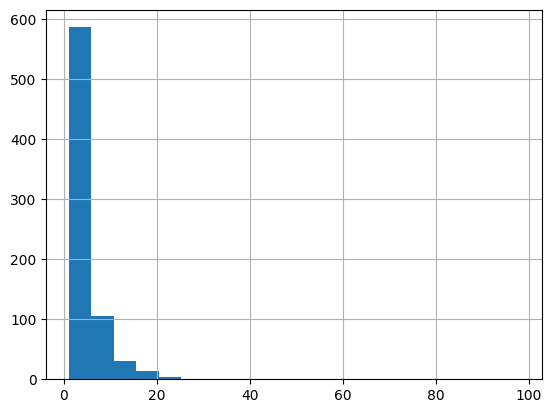

In [21]:
per_image_stats[per_image_stats["with_mask"] > 0]["with_mask"].hist(bins=20)

<Axes: >

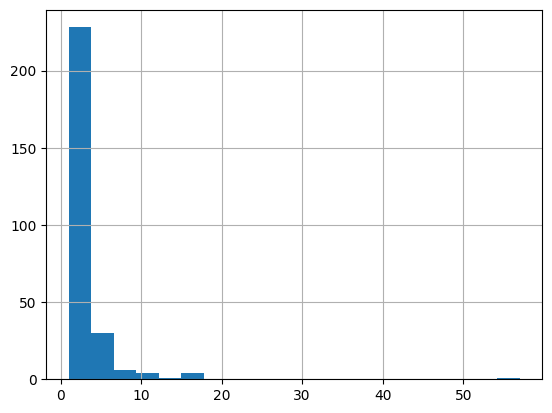

In [22]:
per_image_stats[per_image_stats["without_mask"] > 0]["without_mask"].hist(bins=20)

<Axes: >

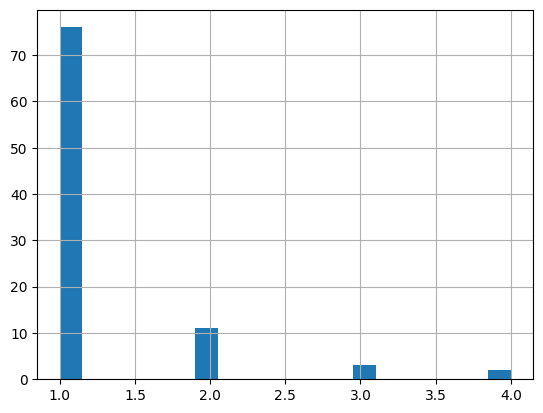

In [23]:
per_image_stats[per_image_stats["mask_weared_incorrect"] > 0]["mask_weared_incorrect"].hist(bins=20)

We have some funny outlier values, i think the outliers are interesting to be put inside of the test set if there's only one, or make a separate "hard cases" scenario. Best case scenario is we can have data points with very high number of objects in all splits, but we'll see later.

Keep in mind each classes don't just show in isolation. The thing with object detection is that one image may contain any number of any classes, so makes more sense to see their co-occurences. Because we're only interested in the 2 "rarer" classes, we can do a 2 way co-occurence heatmap.

<Axes: xlabel='mask_weared_incorrect', ylabel='without_mask'>

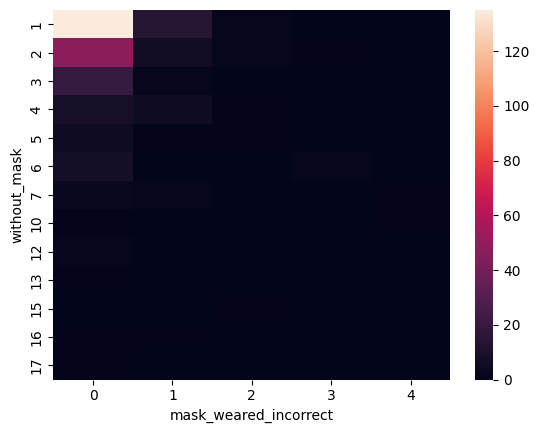

In [24]:
import seaborn as sns

womask_no_outliers = per_image_stats[per_image_stats["without_mask"] < 20]
incorrect_no_outliers = per_image_stats[per_image_stats["mask_weared_incorrect"] < 20]

sns.heatmap(pd.crosstab(womask_no_outliers["without_mask"], incorrect_no_outliers["mask_weared_incorrect"]).iloc[1:, :])

<Axes: xlabel='mask_weared_incorrect', ylabel='without_mask'>

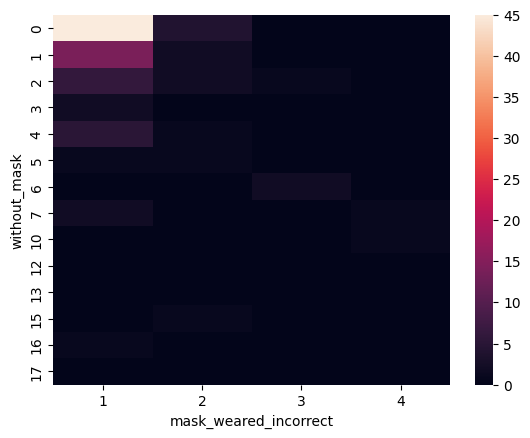

In [25]:
sns.heatmap(pd.crosstab(womask_no_outliers["without_mask"], incorrect_no_outliers["mask_weared_incorrect"]).iloc[:, 1:])

From here we can see that most images only have one or two images of the rarer cases. We can identify some groups / bins we can use as a feature to stratify the data later on.


Next, lets visualize the image as well.

In [26]:
import numpy as np
from IPython import display
import PIL

np.random.seed(RANDOM_SEED)

def cv2_imshow(a):
  """A replacement for cv2.imshow() for use in Jupyter notebooks.

  Args:
    a: np.ndarray. shape (N, M) or (N, M, 1) is an NxM grayscale image. For
      example, a shape of (N, M, 3) is an NxM BGR color image, and a shape of
      (N, M, 4) is an NxM BGRA color image.
  """
  a = a.clip(0, 255).astype('uint8')
  # cv2 stores colors as BGR; convert to RGB
  if a.ndim == 3:
    if a.shape[2] == 4:
      a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
    else:
      a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  display.display(PIL.Image.fromarray(a))

def resize_and_letterbox_image(image, image_size):
    h, w = image.shape[:2]
    resize_ratio = image_size/max(h, w)
    if resize_ratio > 1:
        interpolation = cv2.INTER_CUBIC
    else:
        interpolation = cv2.INTER_AREA
    img_resized = cv2.resize(image, None, fx=resize_ratio, fy=resize_ratio, interpolation=interpolation)
    result_image = np.zeros((image_size, image_size, 3), dtype=np.uint8)
    newh, neww = img_resized.shape[:2]
    if w > h:
        factor = int((image_size - int(h*resize_ratio))/2)
        result_image[factor:factor+newh, :] = img_resized
    else:
        factor = int((image_size - int(w*resize_ratio))/2)
        result_image[:, factor:factor+neww] = img_resized
    return result_image

BOX_COLORS = {
    "with_mask": (0, 255, 0),
    "without_mask": (0, 0, 255),
    "mask_weared_incorrect": (0, 255, 255),
}

def draw_annotation_on_one_image(image, annotation):
    draw_img = image.copy()
    for annot in annotation:
        classname = annot[3]
        xmin, ymin, xmax, ymax = annot[4:8]
        draw_img = cv2.rectangle(draw_img, (xmin, ymin), (xmax, ymax), BOX_COLORS[classname], thickness=1)
    return draw_img

def draw_annotations(images, annotations):
    assert len(images) == len(annotations), f"Mismatch of images and annotations. THey should map one to one. Got {len(images)} images and {len(annotations)} annotations."
    annotated_images = []
    for img, annot_file in zip(images, annotations):
        annots = parse_one_image_annotation(annot_file)
        draw_img = draw_annotation_on_one_image(img, annots)
        annotated_images.append(draw_img)
    return annotated_images

def visualize_image_grid(images, grid_size, image_size):
    image_grid = np.zeros((grid_size*image_size, grid_size*image_size, 3), dtype=np.uint8)
    for i, image in enumerate(images):
        letterboxed_image = resize_and_letterbox_image(image, image_size)
        vindex = i // grid_size
        hindex = i % grid_size
        image_grid[vindex*image_size:(vindex+1)*image_size, hindex*image_size:(hindex+1)*image_size] = letterboxed_image
    cv2_imshow(image_grid)

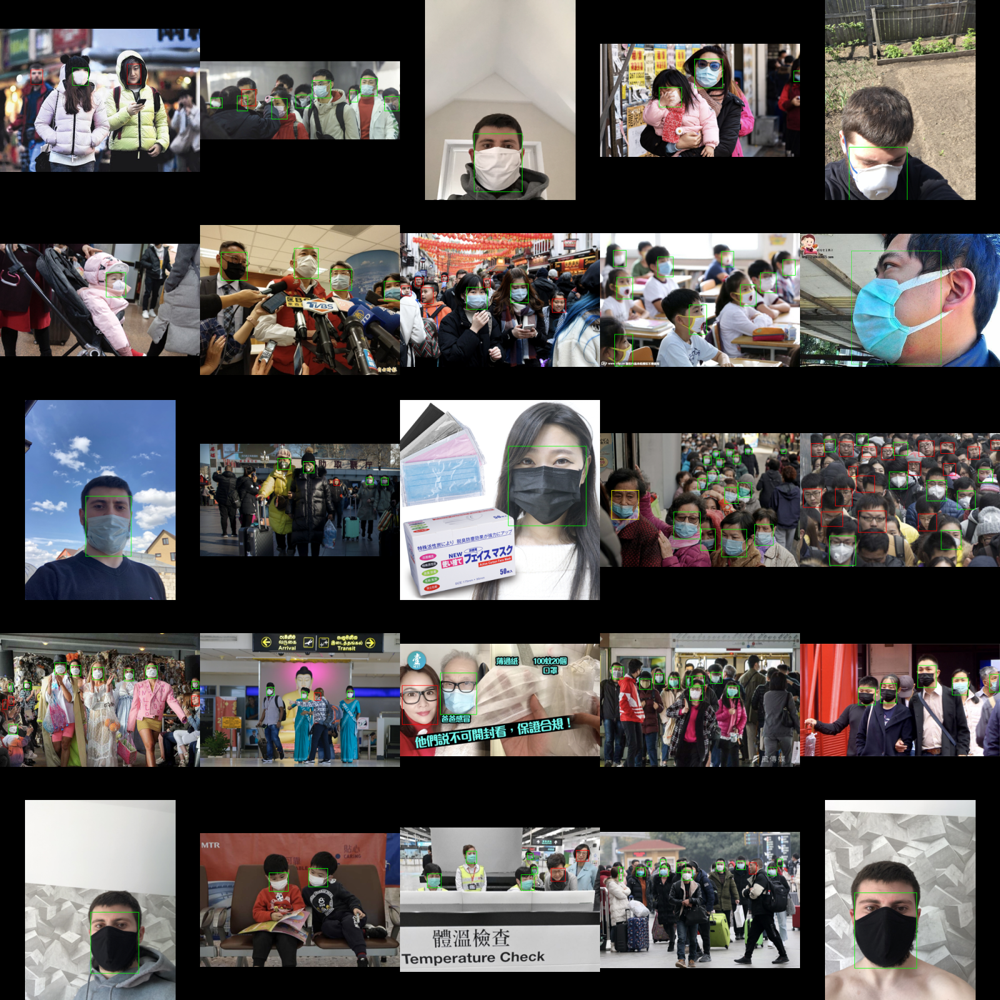

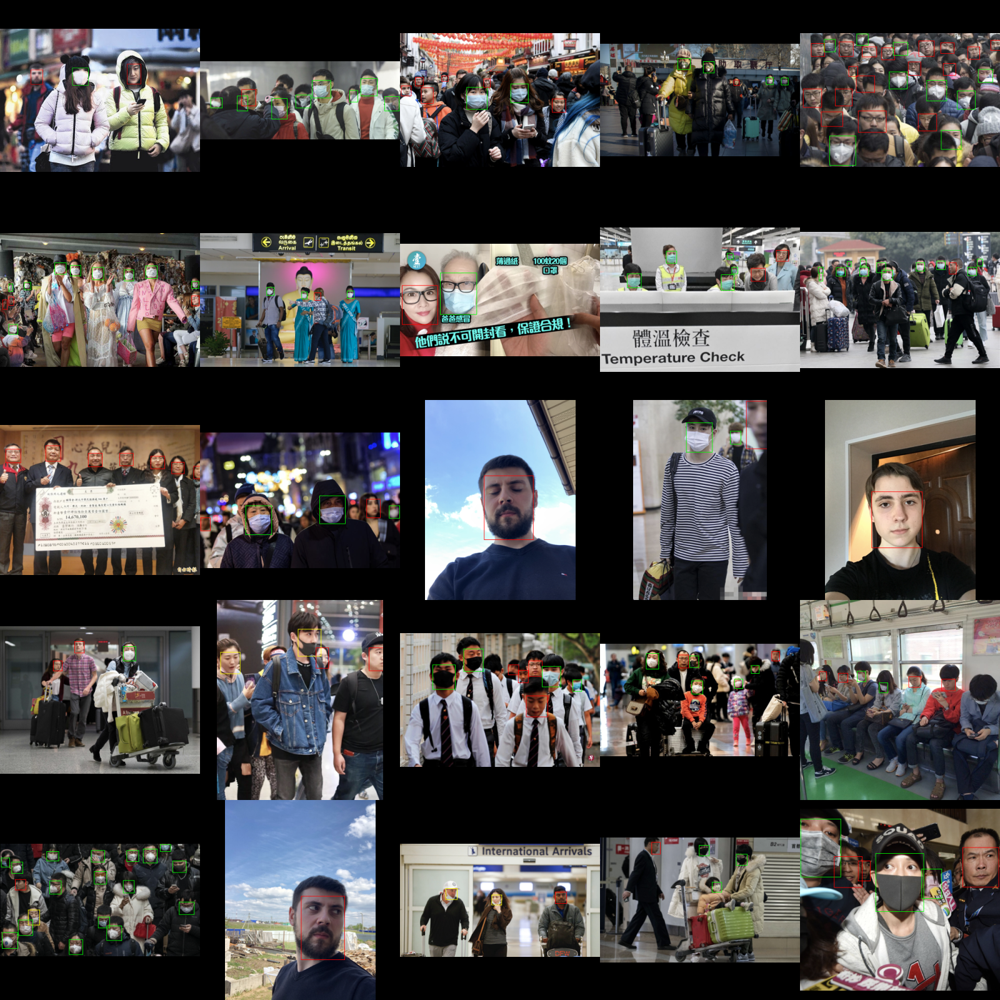

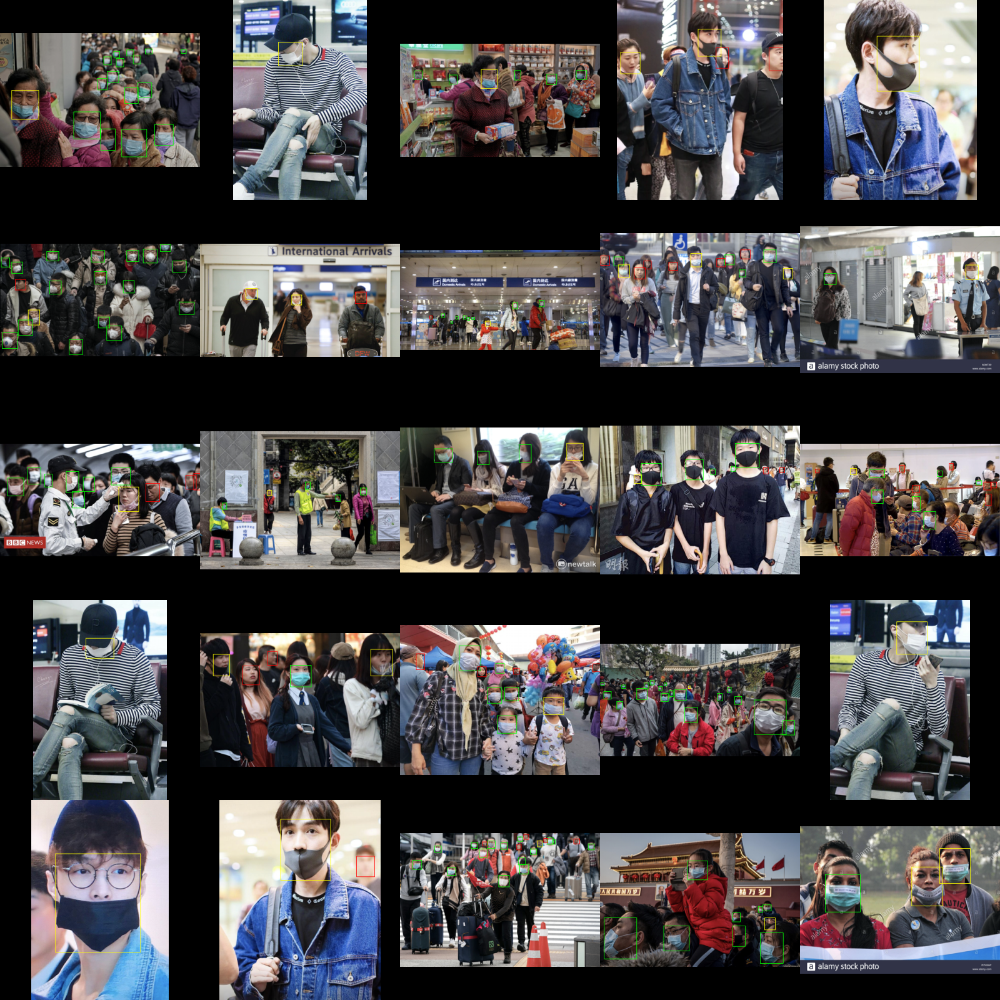

In [27]:
SAMPLE_NUMBER = 25
IMAGE_SIZE = 320

for classname in all_categories:
    classdata = per_image_stats[(per_image_stats[classname] > 0)]
    sampled_images = classdata.index.tolist()[:SAMPLE_NUMBER]
    images = [cv2.imread(os.path.join(IMAGES_PATH, fn), cv2.IMREAD_COLOR) for fn in sampled_images]
    annotations = [os.path.join(ANNOTATIONS_PATH, fn.split(".")[0] + ".xml") for fn in sampled_images]
    images_annotated = draw_annotations(images, annotations)
    visualize_image_grid(images_annotated, 5, IMAGE_SIZE)

## Observation notes

### Based on numerical statistics and distributions alone

As we can see, each of the "rare" classes have varying statistics, naturally most of them only have several occurences per image. But they do interact and overlap, as seen in the heatmap.

the "without_mask" class seem to have a lot of data happening when there's no occurence of "mask_weared_incorrect", so does the opposite.

But interestingly enough, many of the occurence of "mask_weared_incorrect" coincide with the other class. I still think the sampling strategy should just take into account the distribution of the two "minority" classes though.

### Based on visualization

We can see quite a lot of variance. Distance, number of person per image, lighting, angle, etc. A separate exploration also obtained some clusters that might be useful for splitting, but for simplicity i will just use statistics first to split the data.
### Possible strategies for modelling

So what is our strategy here? I think there are two viable paths to solve the minority class problem:

1. Detect the face, then classify if it's with mask, no mask, or improperly wore mask. We still probably need a good splitting strategy here to make sure faces with improper mask wore or no mask can still be detected reliably. For the classification, i think a normal classification will do. Metric learning is also an option for the rare class. The beauty of this method is that we can just mash together all detections as one class, then train a separate model on the cutout to classify, but we will need to run and manage two models.
2. Use an iterative stratified sampling to ensure a healthy balance, then train an object detector as per usual. Simpler.

I will probably go with (2), and see if i can compare it with (1) if i have time. If it's there, it means i have time, but i will go with (2) first.

Before we can compare any strategies though, we need to think of our test data first.

## Deciding on the test scenario

Usually we derive the scenario based on what the development requirement is. From there we can derive what kind of cases we want to test for, the variety based on the problem definition, our assumptions, etc. This time we're just training a model on a random dataset, so I will just try to balance so each varieties of data can be represented both in training and testing.

In reality, this test case will definitely change. We will monitor the performance in production and discover unique failure cases that we will need to test against, or we discover some scenarios are under represented in test data, and so on. For now we will try to find the most ideal split based on the data diversity. Later on additional scenarios might be needed and added as a separate set so it is "comparable" with other models.

I will not cover that in this technical test though.

## Preparing our data: splitting

Ideally we want to split the data stratified by the following:
- total number of classes
- number of class occurences per image
- visual features / variability (probably wont be done in this run)

As for test data, generally we already have specific scenarios or requirement that we want to test against, so a manual curation to some degree is usually done in advance to ensure the test is as close as possible to what the model will see in production. Again, we don't have any of those in the requirement or instructions, so i just take a generic approach here, trying to split the data to ensure similar distributions.

Stratifying works by using a certain class as reference to ensure the distribution is maintained accross splits. I don't think i need to explain further. But the thing with object detection is that it's not a binary / multiclass classification task. It's much more complex because one image may contain instances of multiple classes at once. We cannot naively use the list of objects to split, as they are tied to the image.

One way to do this is to make a "dummy class" based on certain attributes. Since we want to stratify the rarer class and we also want to stratify visual features, we can make a dummy class as follows:
1. For each image, we count the number of each of the rare class. We then make bins (2d bins to be exact) and give a certain ID for each bins. This can be easily visualized using the heatmap I made before. Just imagine every box (bin) has its own ID.
2. Additionally, we can also cluster the image together and use the cluster ID as additonal feature.

For example, an image have 2 without_mask class and 1 mask_wore_incorrectly class and it falls to the 6th bin, and it belongs to the 5th cluster. Then it belongs to the "6_5" dummy class. then we use these dummy classes to stratify as usual.

It's easier to "explain" through code, so lets just do that.

In [28]:
# First, define bins based on above observation.
# nothing scientific here, just reasonable estimates.
with_mask_bins = [(0, 2), (2, 5), (5, 10), (10, 20), (20, np.inf)]
without_mask_bins = [(0, 2), (2, 5), (5, 10), (10, np.inf)]
wrong_mask_bins = [(0, 1), (1, 2), (2, 3), (3, 4), (4, np.inf)]

In [29]:
with_mask_bins = [-1, 3, 5, 10, 20, np.inf]
without_mask_bins = [-1, 3, 5, 10, np.inf]
wrong_mask_bins = [-1, 1, 3, np.inf]

For brevity, and from now on, i will refer to without_mask as NOMASK and mask_weared_incorrect as WRONGMASK.

Next, I think it is only wise to separate images that have no "without_mask" and "mask_weared_incorrect" and split them on their own. Let me deliver my point better. We have a total of 853 images. Next let's see how many images have:
- no NOMASK nor WRONGMASK at all
- no NOMASK but have WRONGMASK
- no WRONGMASK but have NOMASK
- have both WRONGMASK and NOMASK

In [30]:
print(per_image_stats[(per_image_stats["without_mask"] == 0) & (per_image_stats["mask_weared_incorrect"] == 0)].shape)
print(per_image_stats[(per_image_stats["without_mask"] == 0) & (per_image_stats["mask_weared_incorrect"] != 0)].shape)
print(per_image_stats[(per_image_stats["without_mask"] != 0) & (per_image_stats["mask_weared_incorrect"] == 0)].shape)
print(per_image_stats[(per_image_stats["without_mask"] != 0) & (per_image_stats["mask_weared_incorrect"] != 0)].shape)

(507, 3)
(49, 3)
(231, 3)
(43, 3)


So the way we can go about this is by separately handling the images having only WITHMASK faces. Lets get that out of the way and bin them accordingly. Since we have a good amount of data in this segment, a 80-20 split seems like an okay idea for train and test.

In [31]:
just_withmask = per_image_stats[(per_image_stats["without_mask"] == 0) & (per_image_stats["mask_weared_incorrect"] == 0)].copy()
just_withmask["bins"] = pd.cut(just_withmask["with_mask"], with_mask_bins, labels=[f"bin{i}" for i in range(len(with_mask_bins)-1)]).astype(str)
just_withmask.head()

classname,with_mask,without_mask,mask_weared_incorrect,bins
image_name,,,,
maksssksksss10.png,1,0,0,bin0
maksssksksss100.png,3,0,0,bin0
maksssksksss101.png,1,0,0,bin0
maksssksksss102.png,1,0,0,bin0
maksssksksss103.png,4,0,0,bin1


In [32]:
just_withmask["bins"].value_counts()

bins
bin0    363
bin1     72
bin2     52
bin3     17
bin4      3
Name: count, dtype: int64

In [33]:
mixed_bag = per_image_stats.drop(just_withmask.index)
mixed_bag["bins"] = pd.cut(
    mixed_bag["without_mask"],
    without_mask_bins,
    labels=[f"bin{i}" for i in range(len(without_mask_bins)-1)]
).astype(str) + "_" + pd.cut(mixed_bag["mask_weared_incorrect"], wrong_mask_bins, labels=[f"bin{i}" for i in range(len(wrong_mask_bins)-1)]).astype(str)
mixed_bag.head()

classname,with_mask,without_mask,mask_weared_incorrect,bins
image_name,,,,
maksssksksss0.png,1,2,0,bin0_bin0
maksssksksss1.png,8,1,0,bin0_bin0
maksssksksss104.png,2,6,0,bin2_bin0
maksssksksss108.png,4,1,0,bin0_bin0
maksssksksss11.png,15,0,1,bin0_bin0


In [34]:
mixed_bag["bins"].value_counts()

bins
bin0_bin0    268
bin1_bin0     19
bin2_bin0     13
bin0_bin1      9
bin3_bin0      7
bin2_bin1      2
bin2_bin2      2
bin1_bin1      2
bin3_bin1      1
Name: count, dtype: int64

Note: train_test_split does not work when there's only 1 item in a "class", so we will just yoink that out and manually put it in the test set.

Generally, we want at least a sample of each bins inside all the splits. So here's the plan:

If a bin does not have at least 3 images (so we can have at least 1 in train, val, and test), we just directly put them in the test set. Ideally i should find a good dynamic binning method that ensures at least N members are in each bins, but it's okay for now. I think.

If the model can predict them, then great!

If not, then it's a target for data collection in future iterations.

In [35]:
from sklearn.model_selection import StratifiedShuffleSplit

def get_splits(data, labels, test_size):
    train_index, test_index = next(StratifiedShuffleSplit(
        n_splits=1,
        test_size=test_size,
        random_state=RANDOM_SEED
    ).split(data, labels))
    return train_index, test_index

In [36]:
jw_image_files = just_withmask.index.tolist()
jw_bins = just_withmask["bins"].tolist()

jw_train_idx, jw_test_idx = get_splits(jw_image_files, jw_bins, 0.2)

print(len(jw_image_files), len(jw_train_idx), len(jw_test_idx))

507 405 102


In [37]:
mb_bin_counts = mixed_bag["bins"].value_counts()
bins_less_than_three = set(mb_bin_counts[mb_bin_counts < 3].index.tolist())
print(bins_less_than_three)

{'bin3_bin1', 'bin2_bin1', 'bin1_bin1', 'bin2_bin2'}


In [38]:
manual_curated_indices = mixed_bag[mixed_bag["bins"].isin(bins_less_than_three)].index
print(manual_curated_indices)

Index(['maksssksksss156.png', 'maksssksksss305.png', 'maksssksksss52.png',
       'maksssksksss603.png', 'maksssksksss627.png', 'maksssksksss657.png',
       'maksssksksss760.png'],
      dtype='object', name='image_name')


In [39]:
mixed_bag_dropped = mixed_bag.drop(manual_curated_indices)

mb_image_files = mixed_bag_dropped.index.tolist()
mb_bins = mixed_bag_dropped["bins"].tolist()

# give a bit more so we have more data for reliable testing
# this is horrible and not ideal as usually we should have a carefully picked
# and curated test set at this point, but we work with what we have now
# i aim for at least 100 images for testing. Keep in mind we also have the 7 other images to insert later
mb_train_idx, mb_test_idx = get_splits(mb_image_files, mb_bins, 0.3)
print(len(mb_image_files), len(mb_train_idx), len(mb_test_idx))

316 221 95


Now that splitting is done, we can assemble the datasets. Training will be split again later on, test will be kept secret and safe

In [40]:
train_data = [jw_image_files[i] for i in (jw_train_idx)] + [mb_image_files[i] for i in (mb_train_idx)]
test_data = [jw_image_files[i] for i in (jw_test_idx)] + [mb_image_files[i] for i in (mb_test_idx)] + manual_curated_indices.astype(str).tolist()

In [41]:
print(len(train_data), len(test_data))

626 204


In [42]:
per_image_stats_train = per_image_stats.loc[train_data].copy()

In [43]:
train_just_withmask = per_image_stats_train[(per_image_stats_train["without_mask"] == 0) & (per_image_stats_train["mask_weared_incorrect"] == 0)].copy()
train_just_withmask["bins"] = pd.cut(train_just_withmask["with_mask"], with_mask_bins, labels=[f"bin{i}" for i in range(len(with_mask_bins)-1)]).astype(str)
train_just_withmask["bins"].value_counts()

bins
bin0    290
bin1     57
bin2     42
bin3     14
bin4      2
Name: count, dtype: int64

In [44]:
train_mixed_bag = per_image_stats_train.drop(train_just_withmask.index)
train_mixed_bag["bins"] = pd.cut(
    train_mixed_bag["without_mask"],
    without_mask_bins,
    labels=[f"bin{i}" for i in range(len(without_mask_bins)-1)]
).astype(str) + "_" + pd.cut(train_mixed_bag["mask_weared_incorrect"], wrong_mask_bins, labels=[f"bin{i}" for i in range(len(wrong_mask_bins)-1)]).astype(str)
train_mixed_bag["bins"].value_counts()

bins
bin0_bin0    188
bin1_bin0     13
bin2_bin0      9
bin0_bin1      6
bin3_bin0      5
Name: count, dtype: int64

~~~ As before, we just immediately put bins with only 1 member to the validation set. This is overengineering, but I'd like to make it dynamic so later on when we have better binning we dont have to change anything. ~~~

In [45]:
# train_mb_bin_counts = train_mixed_bag["bins"].value_counts()
# bins_less_than_two = set(train_mb_bin_counts[train_mb_bin_counts < 2].index.tolist())
# print(bins_less_than_two)
# train_manual_curated_indices = train_mixed_bag[train_mixed_bag["bins"].isin(bins_less_than_two)].index
# print(train_manual_curated_indices)

Set a flat 100 images for val. That's the least amount im comfortable with.

In [46]:
train_jw_image_files = train_just_withmask.index.tolist()
train_jw_bins = train_just_withmask["bins"].tolist()

jw_train_idx, jw_val_idx = get_splits(train_jw_image_files, train_jw_bins, 100)

print(len(train_jw_image_files), len(jw_train_idx), len(jw_val_idx))

# train_mixed_bag_dropped = train_mixed_bag.drop(train_manual_curated_indices)

train_mb_image_files = train_mixed_bag.index.tolist()
train_mb_bins = train_mixed_bag["bins"].tolist()

# give a bit more so we have more data for reliable testing
# this is horrible and not ideal as usually we should have a carefully picked
# and curated test set at this point, but we work with what we have now
mb_train_idx, mb_val_idx = get_splits(train_mb_image_files, train_mb_bins, 100)
print(len(train_mb_image_files), len(mb_train_idx), len(mb_val_idx))

405 305 100
221 121 100


In [47]:
train_data = [train_jw_image_files[i] for i in (jw_train_idx)] + [train_mb_image_files[i] for i in (mb_train_idx)]
val_data = [train_jw_image_files[i] for i in (jw_val_idx)] + [train_mb_image_files[i] for i in (mb_val_idx)]

In [48]:
print(len(train_data), len(val_data), len(test_data))

426 200 204


As a sanity check, lets plot the distribution of training and test data for each of the categories

In [49]:
per_image_stats_train = per_image_stats.loc[train_data]
per_image_stats_val = per_image_stats.loc[val_data]
per_image_stats_test = per_image_stats.loc[test_data]

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

def compare_distribution(dfs, column):
    plt.figure(figsize=(10, 6))
    for label, df in dfs:
        sns.kdeplot(data=df[column], label=label, alpha=0.6)
        # sns.kdeplot(data=test_df[column], label='Test', alpha=0.6)

    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.title(f'{column} distribution comparison')
    plt.legend()
    plt.show()

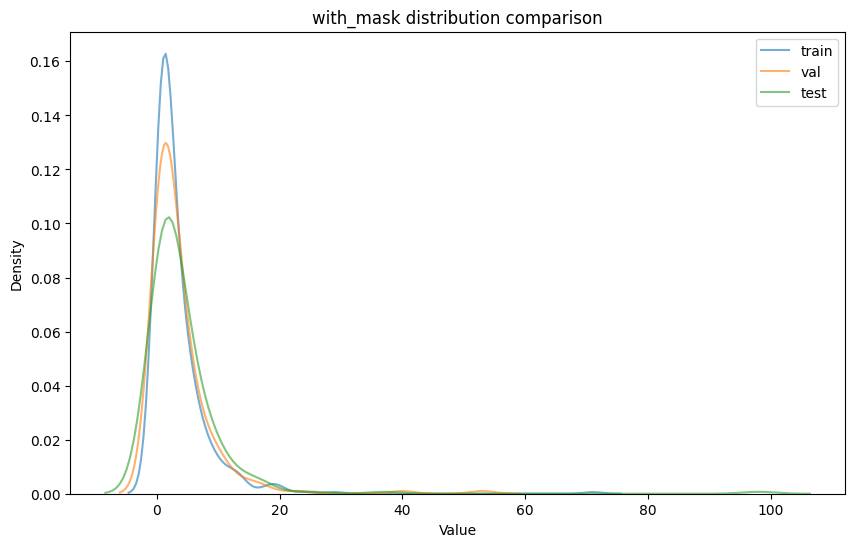

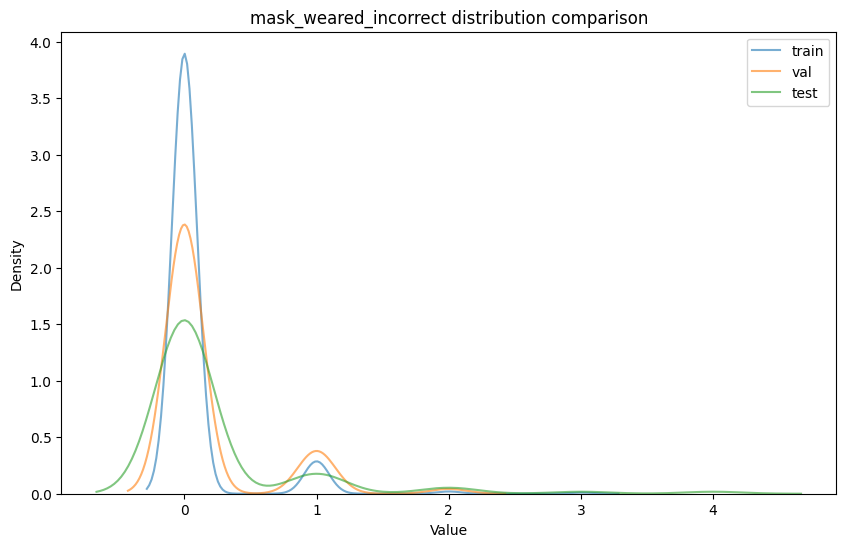

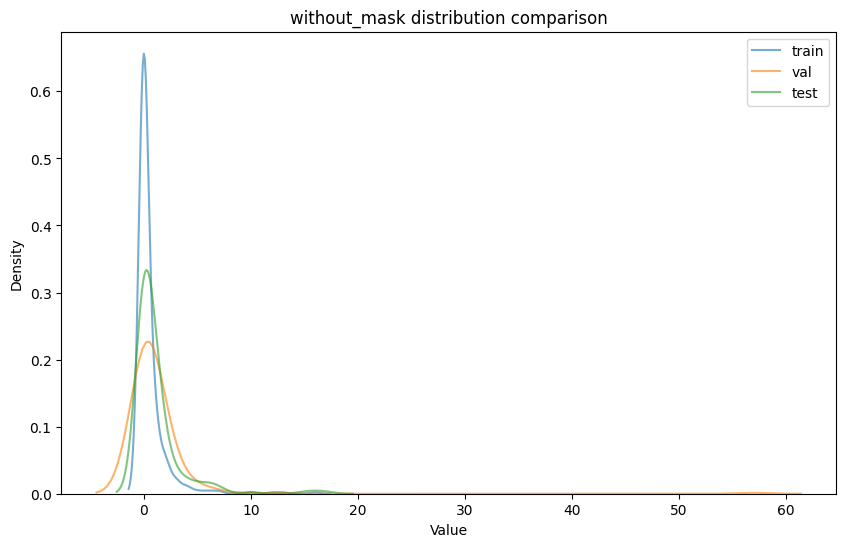

In [51]:
for col in ["with_mask", "mask_weared_incorrect", "without_mask"]:
    compare_distribution([("train", per_image_stats_train), ("val", per_image_stats_val), ("test", per_image_stats_test)], col)

I was worried the splitting method would give us horrible result (wildly different distributions) but thank god that is not the case.

Finally, we can save our splits and carry on to training

In [ ]:
TRAINING_DATASET_DIRECTORY = "./dataset"
os.makedirs(TRAINING_DATASET_DIRECTORY, exist_ok=True)

In [54]:
with open(os.path.join(TRAINING_DATASET_DIRECTORY, "train.txt"), "w") as f:
    f.write("\n".join(train_data))

with open(os.path.join(TRAINING_DATASET_DIRECTORY, "valid.txt"), "w") as f:
    f.write("\n".join(val_data))

with open(os.path.join(TRAINING_DATASET_DIRECTORY, "test.txt"), "w") as f:
    f.write("\n".join(test_data))

# Training

So after we built our test set, we can start thinking about model development, as now we have a benchmark to compare solutions against. That being said, I will only do one iteration of data prep -> training -> eval -> error analysis.

I will also limit the implementation to the second approach discussed on the EDA notebook. It is simpler, doesnt involve training two separate models, and most importantly, saves me time.

For training the model, we're gonna use Roboflow's RF-DETR. I usually use YOLO-based detectors, but recently RF-DETR (built on top of the DETR) shows really good performance for varying scenarios even on smaller models (compared to YOLO), which is ideal for real time detection use cases. It also uses DINOv2 Backend too which is very powerful.

Aside of technical reason, RF-DETR also have a much more permissible licensing compared to Ultralytic's YOLO series. I know i can probably also use the latest iteration from the original Darknet YOLO Repository, but RF-DETR outperforms them, according to their benchmark.

I know DINOv3 is released already, but to save time i will avoid constructing the model from scratch.

First, let's convert our data to a strcutre and format they use.

In [55]:
# you will need to do this once, then restart the session
!pip install rfdetr

In [ ]:
import os
import json
import xml.etree.ElementTree as ET
import shutil
from PIL import Image


def parse_voc_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    objects = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        objects.append({
            'name': name,
            'bbox': [xmin, ymin, xmax, ymax]
        })

    size = root.find('size')
    if size is not None:
        width = int(size.find('width').text)
        height = int(size.find('height').text)
    else:
        width = None
        height = None

    return objects, width, height


def convert_to_coco(images_dir, annotations_dir, split_file, dataset_dir, categories):
    """Convert VOC annotations to COCO format for a specific split."""

    with open(split_file, 'r') as f:
        image_files = [line.strip() for line in f.readlines()]

    coco_format = {
        "info": {
            "year": "2025",
            "version": "1",
            "description": "From Kaggle",
            "contributor": "Kaggle",
            "url": "https://www.kaggle.com/datasets/andrewmvd/face-mask-detection",
            "date_created": "2025-01-01T00:00:00+00:00"
        },
        "licenses": [
            {
                "id": 1,
                "url": "https://creativecommons.org/publicdomain/zero/1.0/",
                "name": "Public Domain"
            }
        ],
        'images': [],
        'annotations': [],
        'categories': categories
    }

    cat_name_to_id = {cat['name']: cat['id'] for cat in categories}

    annotation_id = 1

    for image_id, image_file in enumerate(image_files, start=1):
        # Handle different possible extensions
        image_name = image_file
        if not any(image_file.endswith(ext) for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']):
            # Try to find the actual file
            for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']:
                potential_path = os.path.join(images_dir, image_file + ext)
                if os.path.exists(potential_path):
                    image_name = image_file + ext
                    break

        image_path = os.path.join(images_dir, image_name)

        # Get corresponding XML annotation file
        xml_name = os.path.splitext(image_file)[0] + '.xml'
        xml_path = os.path.join(annotations_dir, xml_name)

        if not os.path.exists(xml_path):
            print(f"Warning: Annotation not found for {image_file}, skipping...")
            continue

        # Parse XML annotation
        objects, xml_width, xml_height = parse_voc_xml(xml_path)

        # Get image dimensions
        if xml_width and xml_height:
            width, height = xml_width, xml_height
        else:
            # Fall back to reading actual image
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
            except Exception as e:
                print(f"Error reading image {image_path}: {e}, skipping...")
                continue

        # Add image info
        coco_format['images'].append({
            'id': image_id,
            'file_name': image_name,
            'width': width,
            'height': height
        })

        # Add annotations for this image
        for obj in objects:
            class_name = obj['name']
            if class_name not in cat_name_to_id:
                print(f"Warning: Unknown class '{class_name}' in {xml_name}, skipping this annotation...")
                continue

            # Convert bbox from [xmin, ymin, xmax, ymax] to [x, y, width, height]
            xmin, ymin, xmax, ymax = obj['bbox']
            bbox_width = xmax - xmin
            bbox_height = ymax - ymin
            area = bbox_width * bbox_height

            coco_format['annotations'].append({
                'id': annotation_id,
                'image_id': image_id,
                'category_id': cat_name_to_id[class_name],
                'bbox': [xmin, ymin, bbox_width, bbox_height],
                'area': area,
                'iscrowd': 0
            })
            annotation_id += 1

    foldername = os.path.basename(split_file)[:-4]
    splitfolder = os.path.join(dataset_dir, foldername)
    os.makedirs(splitfolder, exist_ok=True)
    with open(os.path.join(splitfolder, "_annotations.coco.json"), "w") as f:
        json.dump(coco_format, f, indent=2)
    for image_file in image_files:
        shutil.copy(os.path.join(images_dir, image_file), splitfolder)


In [63]:
from glob import glob

CATEGORIES = [{"id": i+1, "name": name, "supercategory": None} for i, name in enumerate(["with_mask", "without_mask", "mask_weared_incorrect"])]

for splitfile in glob(os.path.join(TRAINING_DATASET_DIRECTORY, "*.txt")):
    convert_to_coco(IMAGES_PATH, ANNOTATIONS_PATH, splitfile, TRAINING_DATASET_DIRECTORY, CATEGORIES)

We have our data splits, we also have our data formatted and ready to use. The next thing to determine is the augmentation we want for our dataset.

By default, RF-DETR already applied some augmentations OOTB:
- Random Resizing
- Random Cropping
- Color Jittering
- Horizontal Flipping

They havent went around to add more or integrate with known libraries like `albumentations`, so that's all we have. We can't even really configure them that much without touching the original repo.

[A nice PR](https://github.com/roboflow/rf-detr/pull/263) is already ongoing to address exactly that but have not been merged yet. For now, we will just proceed with what we already have. We can always change later on if we need to use other libraries, since we already have our test set to benchmark the changes.

For starters, let's use the base model (29M parameters).

In [ ]:
from rfdetr import RFDETRBase

TRAIN_DIR = "./train"
train_output_dir = os.path.join(TRAIN_DIR, "outputs")
train_ckpt_dir = os.path.join(TRAIN_DIR, "ckpts")

os.makedirs(train_output_dir, exist_ok=True)
os.makedirs(train_ckpt_dir, exist_ok=True)

model = RFDETRBase()

model.train(
    dataset_dir=TRAINING_DATASET_DIRECTORY,
    epochs=20,
    batch_size=2,
    grad_accum_steps=8,
    lr=1e-4,
    output_dir=train_output_dir
)

I dont want to waste precious GPU time, so i just immediately zip and download it for local analysis.

In [67]:
!zip -r train.zip train

  adding: train/ (stored 0%)
  adding: train/outputs/ (stored 0%)
  adding: train/outputs/events.out.tfevents.1770613692.6cd850a5a52d.211.2 (deflated 9%)
  adding: train/outputs/events.out.tfevents.1770616478.6cd850a5a52d.211.4 (deflated 54%)
  adding: train/outputs/checkpoint_best_total.pth (deflated 7%)
  adding: train/outputs/checkpoint.pth (deflated 8%)
  adding: train/outputs/events.out.tfevents.1770613649.6cd850a5a52d.211.0 (deflated 9%)
  adding: train/outputs/checkpoint0009.pth (deflated 8%)
  adding: train/outputs/checkpoint_best_ema.pth (deflated 8%)
  adding: train/outputs/log.txt (deflated 76%)
  adding: train/outputs/results.json (deflated 68%)
  adding: train/outputs/events.out.tfevents.1770613672.6cd850a5a52d.211.1 (deflated 9%)
  adding: train/outputs/eval/ (stored 0%)
  adding: train/outputs/eval/latest.pth (deflated 92%)
  adding: train/outputs/eval/000.pth (deflated 92%)
  adding: train/outputs/checkpoint_best_regular.pth (deflated 8%)
  adding: train/outputs/events.